In [ ]:
!pip install -q -r '/content/requirements.txt'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 175.1 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.3/527.3 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.9/82.9 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently

In [ ]:
import numpy as np
import pandas as pd
import streamlit as st
import torch
from PIL import Image
from io import BytesIO
import requests
from sklearn.decomposition import PCA
import umap
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans,DBSCAN # Kmeans for Centroidal Cluserting while DBSCAN for density based
from transformers import CLIPProcessor,CLIPModel
from PIL import UnidentifiedImageError
import plotly.express as px
from tqdm import tqdm
import matplotlib.pyplot as plt
#import supervision as sv
import random

device="cuda" if torch.cuda.is_available() else "cpu"

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor=CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

from datasets import load_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
!kaggle datasets download -d anantjain1223/coyo-1k-reduced

Dataset URL: https://www.kaggle.com/datasets/anantjain1223/coyo-1k-reduced
License(s): MIT
  0% 0.00/358k [00:00<?, ?B/s]
100% 358k/358k [00:00<00:00, 107MB/s]


In [ ]:
!unzip /content/coyo-1k-reduced.zip

Archive:  /content/coyo-1k-reduced.zip
  inflating: coyo-1k.csv             


In [ ]:
import pandas as pd

df=pd.read_csv("/content/coyo-1k.csv")
df.head()

,Unnamed: 0,url,key,image_phash,original_caption,tag,attribute,short_caption,detailed_caption,llm_caption
0,0,https://www.equipmentsalesandsurplus.com/v/vsp...,9113,e5989a6799687992,"Powermatic 60HH, 8"" Jointer with Helical Cutte...",['Jointer' 'Wood shaper' 'Thickness planer'],['repair which is a workbench or other surface...,['a table sawing machine on a white background'],['a planer that is sitting on a table'\r\n 'a ...,['A table sawing machine on an all-white backg...
1,1,https://texasfurniturehut.com/images/thumbs/00...,7371,be179168cce0cc97,Picture of ELIJAH LEATHER POWER RECLINER,['recliner' 'Power seat' 'Club chair'],['recliner which has upholstered in fabric or ...,['a brown leather recliner chair on a white ba...,['a brown recliner sitting in front of a white...,['A Brown Leather Recliner Chair On A White Ba...
2,2,https://cdn.shopify.com/s/files/1/1909/0703/pr...,1662,c04b03b43f1f3a67,"8 x 10 Reprinted Old Photo of U.S. Mail, Tanan...",['Dog sled' 'Sled dog' 'Sled dog racing'],['dog sled which has snow or ice'\r\n 'dog sle...,['a black and white photo of a dog team pullin...,['a man riding a dog sled past a post office'\...,['A black and white photo of a dog team pullin...
3,3,https://kelliesdesigns.net/wp-content/uploads/...,3390,f9e3c64e0cd8b036,Police Officer In His Hands Snap Tab,['Police officer' 'Police commissioner' 'Handc...,['policeman which has badge' 'cop which has ba...,['a pair of key chains with a police officer o...,"[""two key keychains with police officer's unif...","[""A pair of handmade key chains with a police ..."
4,4,https://cdn.houseplansservices.com/product/9ea...,3666,84cfbfb0c8cab20e,House Design - Colonial Exterior - Front Eleva...,['farmhouse' 'manufactured home'\r\n 'North am...,"['house which has exterior walls with siding, ...",['this is a computer rendering of a house'],['a two story brick house with a garage and po...,['This is a computer rendered image of a house...


In [ ]:
train_dataset=load_dataset("recastai/coyo-75k-augmented-captions")['train']
test_dataset=load_dataset("recastai/coyo-75k-augmented-captions")['test']

Generating train split:   0%|          | 0/73480 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/935 [00:00<?, ? examples/s]

In [ ]:
train_dataset

Dataset({
    features: ['url', 'key', 'image_phash', 'original_caption', 'tag', 'attribute', 'short_caption', 'detailed_caption', 'llm_caption'],
    num_rows: 73480
})

## Train dataset ~1000 rows selected for embeddings

In [ ]:
def plot_images_grid(images,text,grid_size=(5, 5), titles=None, size=(5, 5), cmap=None, index=None):
    from math import ceil

    nrows, ncols = grid_size
    fig, axes = plt.subplots(nrows, ncols, figsize=size)

    if nrows == 1 and ncols == 1:
        axes = [axes]  # Make axes iterable if it's a single Axes object
    else:
        axes = axes.flatten()

    for idx, (img,txt) in enumerate(zip(images,text)):
        if index:
          txt=txt+str(index)
        if isinstance(img, Image.Image):
            img = img.convert("RGB")
        if cmap:
            axes[idx].imshow(img, cmap=cmap)
        else:
            axes[idx].imshow(img)

        axes[idx].set_title(txt, fontsize=10)

        axes[idx].axis('off')


    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

from tqdm import tqdm

dataframe=pd.DataFrame()
def get_image_embeddings(data):
    error_count = 0
    error_urls = []
    image_embeddings = []
    coutn=0
    data_text=data['llm_caption']
    data_url=data['url']

    dataframe=pd.DataFrame({'url':data_url,'text':data_text})
    for _,row in tqdm(dataframe.iterrows(),total=1000,desc="Processing Image"):
            image_url = row['url']
            text=row['text'][0]
            try:
                coutn+=1

                if coutn ==1000:
                    break

                response = requests.get(image_url)
                response.raise_for_status()  # Raise an exception for non-2xx status codes

                # Check if the content type is an image
                image=Image.open(BytesIO(response.content))
                if coutn<5:
                    plot_images_grid([image],[text], grid_size=(1, 1))


                inputs=processor(images=image,return_tensors="pt").to(device)
                with torch.no_grad():
                    image_embedding=model.get_image_features(**inputs)
                image_embeddings.append(image_embedding.squeeze().cpu().numpy())

            except (requests.exceptions.RequestException, UnidentifiedImageError, ValueError) as e:
                error_urls.append(image_url)
                error_count += 1

    return image_embeddings,dataframe


Processing Image:   0%|          | 0/1000 [00:00<?, ?it/s]

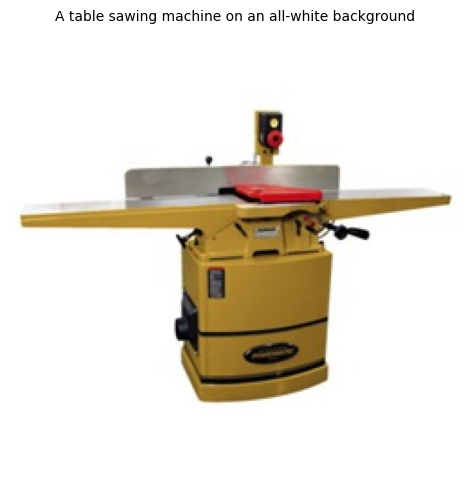

Processing Image:   0%|          | 1/1000 [00:02<44:05,  2.65s/it]

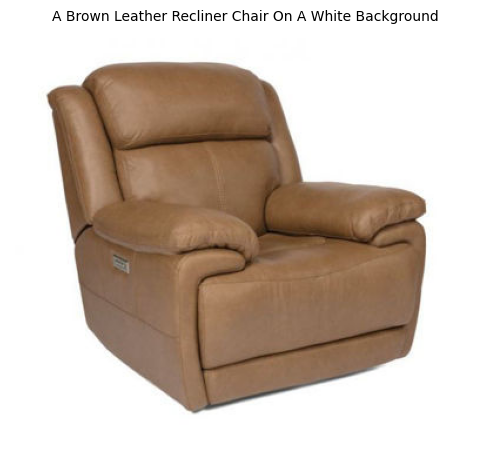

Processing Image:   0%|          | 2/1000 [00:03<24:15,  1.46s/it]

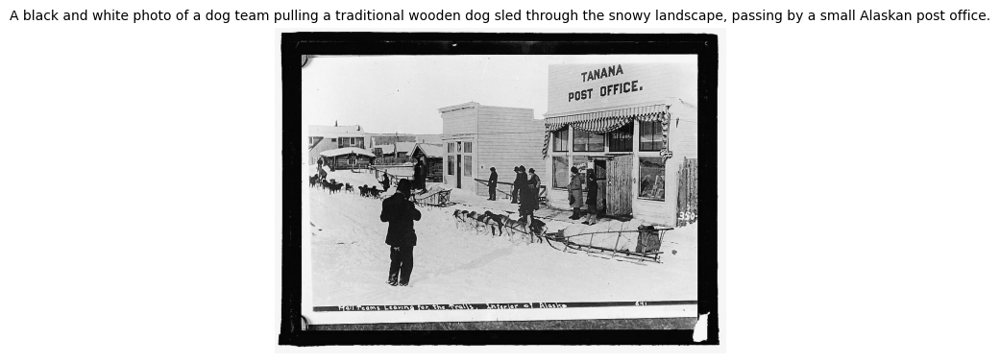

Processing Image:  14%|█▎        | 137/1000 [00:58<03:47,  3.79it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Processing Image: 100%|█████████▉| 999/1000 [14:46<00:00,  1.13it/s]


In [ ]:
image_embeddings,dataframe=get_image_embeddings(train_dataset)

#Saving the dataframe

In [ ]:
dataframe.to_csv("url_text.csv",index=False)

In [ ]:
dataframe

,url,text
0,https://www.equipmentsalesandsurplus.com/v/vsp...,[A table sawing machine on an all-white backgr...
1,https://texasfurniturehut.com/images/thumbs/00...,[A Brown Leather Recliner Chair On A White Bac...
2,https://images.hotukdeals.com/threads/thread_l...,[A blue hiking shoe with black laces provides ...
3,https://cdn.shopify.com/s/files/1/1909/0703/pr...,[A black and white photo of a dog team pulling...
4,https://kelliesdesigns.net/wp-content/uploads/...,[A pair of handmade key chains with a police o...
...,...,...
73475,https://chrismenardtraining.com/_CMT/images/bl...,"[A Break Even Analysis Chart In Excel, A Break..."
73476,https://www.freakden.com/wp-content/uploads/20...,"[A maid lies prone across the floor, her raise..."
73477,https://www.provenceclassics.com/media/home/th...,[A sleek silver sports car with a two-tone pai...
73478,https://cdn.shopify.com/s/files/1/0281/7733/44...,"[A man lying on the ground with a rugby ball.,..."


In [ ]:
len(image_embeddings)

872

## Understanding the text of first 100 rows after converting strings to list

In [ ]:
import ast
pd.set_option('display.max_rows', 100)
df=pd.read_csv("/content/url_text.csv")
df['text'] = df['text'].apply(ast.literal_eval)

c=0
for text in df['text'].head(200):
  print(text[0])
  print(c)
  c+=1

A table sawing machine on an all-white background
0
A Brown Leather Recliner Chair On A White Background
1
A blue hiking shoe with black laces provides sturdy ankle assistance and water protection ideal for backpackers who want to traverse rugged terrain while maintaining their comfort and safety
2
A black and white photo of a dog team pulling a traditional wooden dog sled through the snowy landscape, passing by a small Alaskan post office.
3
A pair of handmade key chains with a police officer emblem adorned on them dangles from someone's hands.
4
This is a computer rendered image of a house.
5
A stunning panoramic view of the Grand Canyon from the top of a rugged cliff, highlighting its towering red rock formations and vast expanse below
6
A towering missile stands in contrast to the sleek space shuttle, both made byLockheed Martin.
7
A sandwich with fillings visible through a toasty brown crust.
8
The cover of Jude the Obscure by Thomas Hardy depicts a serene landscape with trees and

## Through this, we have identified pictures at index:
- 43
- 45
- 47
- 60
- 68
- 78

Since these images are similar as they have people posing for photos either a model or a man or a family.

## Let's see how the images look like!

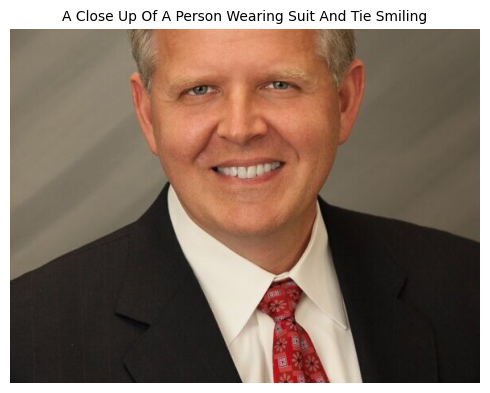

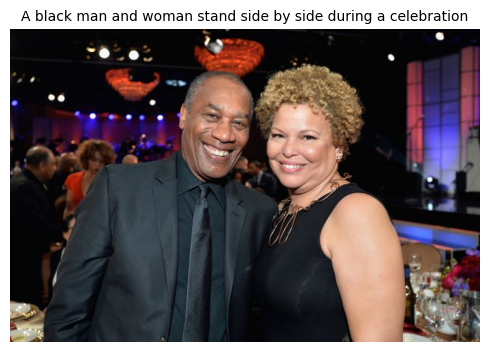

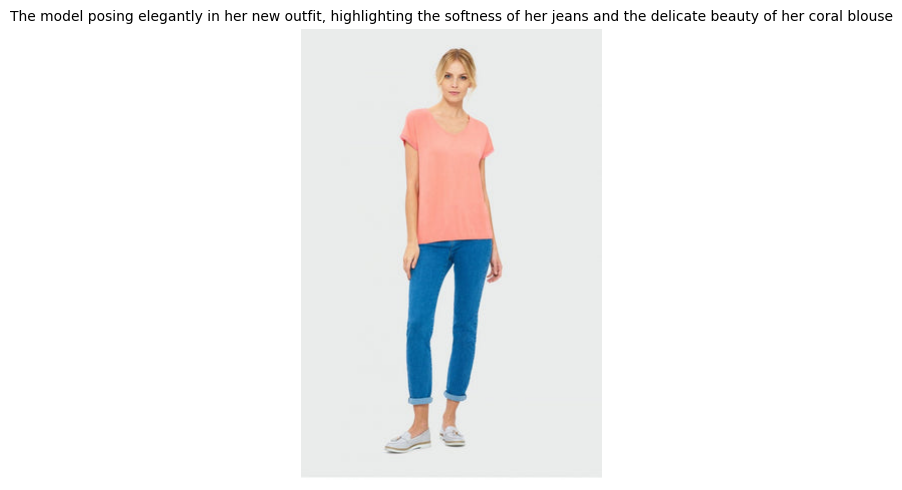

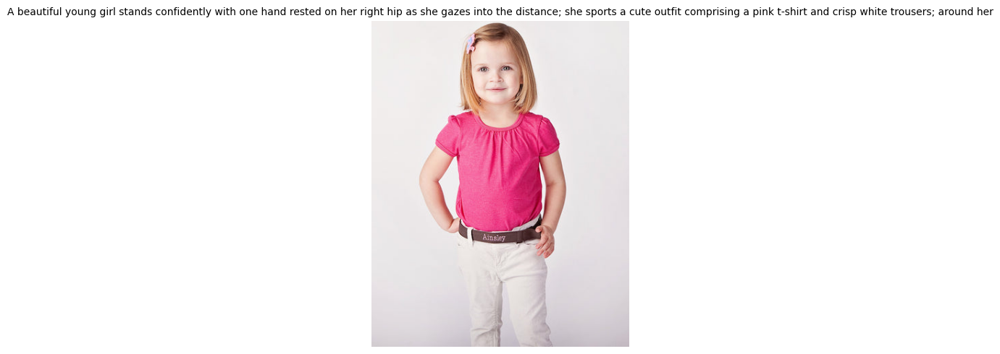

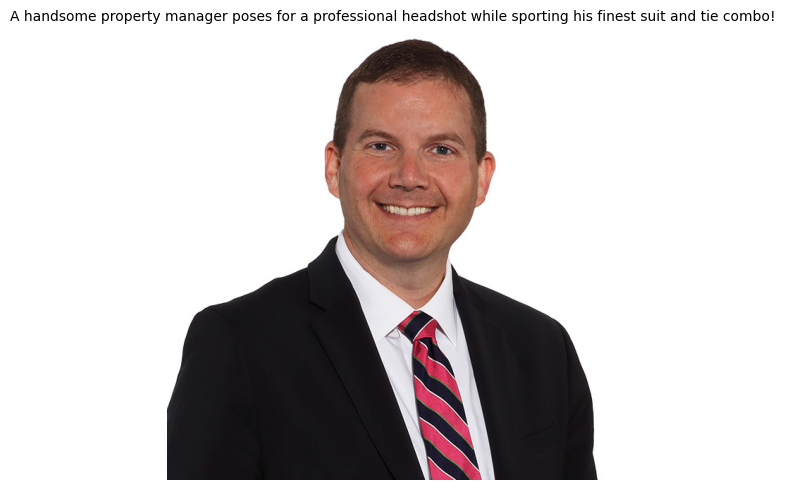

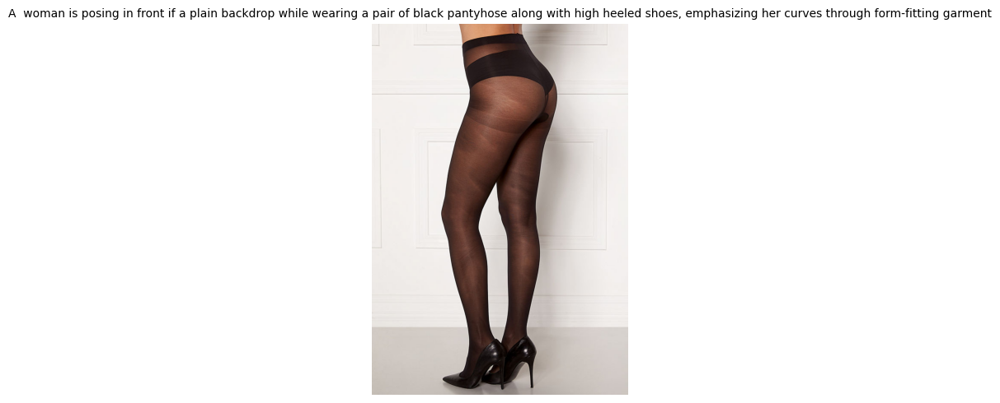

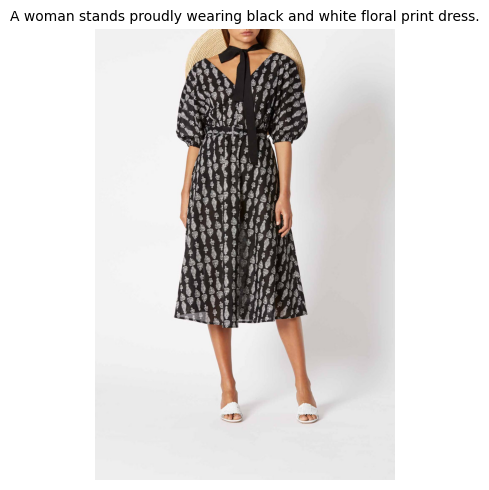

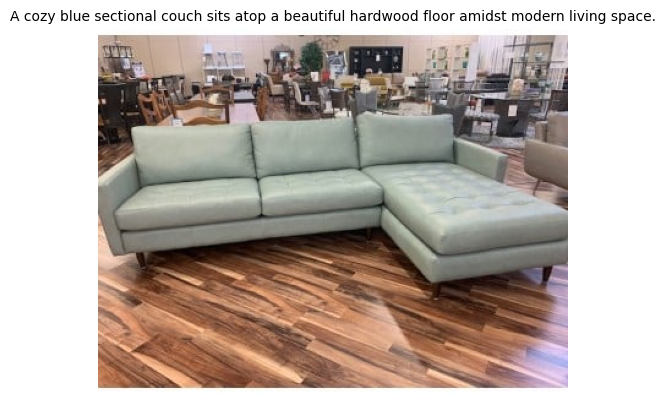

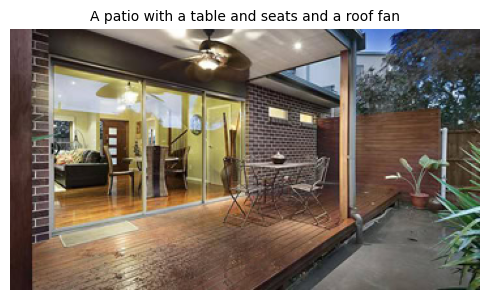

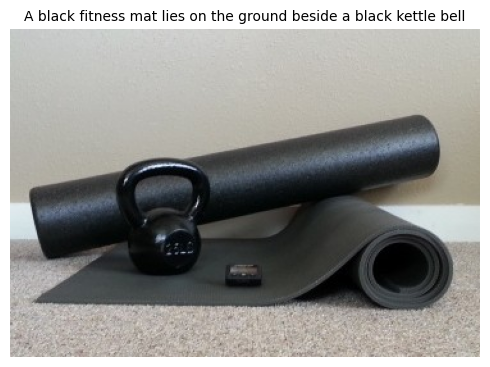

<ipython-input-8-f45d0c4251ee>:30: UserWarning: Glyph 127968 (\N{HOUSE BUILDING}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127968 (\N{HOUSE BUILDING}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


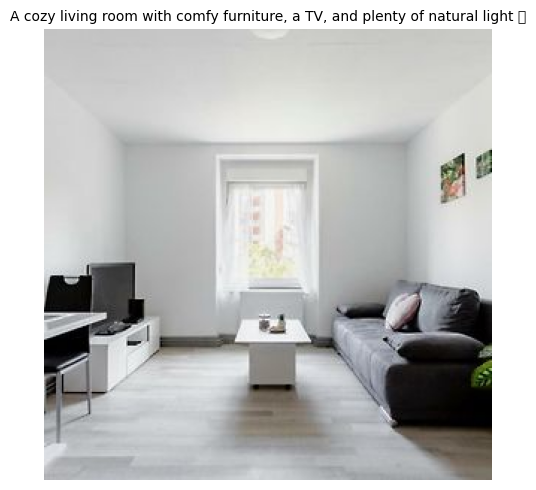

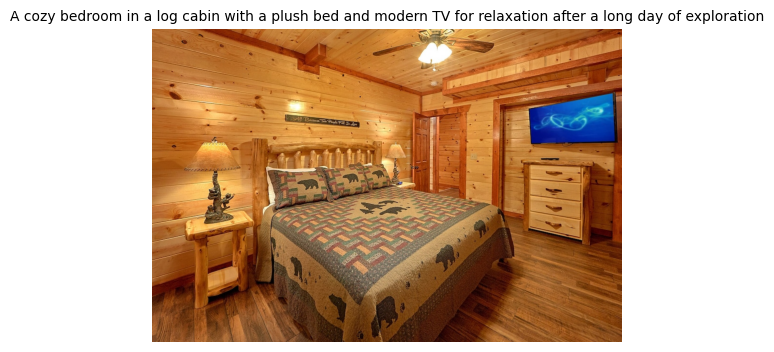

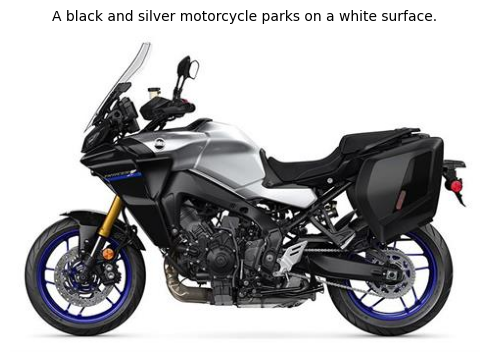

In [ ]:
test_index=[43,45,47,60,68,78,178,165,190,189,187,186,152,193,163]
image_embeddings=[]
failed_index=[]

for index in test_index:
    row=df.iloc[index]
    image_url = row['url']
    text=row['text'][0]
    try:
      response = requests.get(image_url)
      response.raise_for_status()  # Raise an exception for non-2xx status codes
      image=Image.open(BytesIO(response.content))
      plot_images_grid([image],[text], grid_size=(1, 1))
      inputs=processor(images=image,return_tensors="pt").to(device)
      with torch.no_grad():
          image_embedding=model.get_image_features(**inputs)
      image_embeddings.append(image_embedding.squeeze().cpu().numpy())

    except (requests.exceptions.RequestException, UnidentifiedImageError, ValueError) as e:
      failed_index.append(index)
      continue

## We have now taken 5 images that look similar (People posing for camera)
## Index 78 url is not working.. No worries, lets move on!

# Visualisation of these images and their corresponding text to understand the relation between text and image embeddings

In [ ]:
dataframe=df.iloc[test_index].copy()

In [ ]:
dataframe

,url,text
43,https://orthopedicnj.com/attachments/News/103/...,[A Close Up Of A Person Wearing Suit And Tie S...
45,https://hellobeautiful.com/wp-content/uploads/...,[A black man and woman stand side by side duri...
47,https://cdn.shopify.com/s/files/1/0011/5284/38...,"[The model posing elegantly in her new outfit,..."
60,https://cdn.shopify.com/s/files/1/1123/8612/pr...,[A beautiful young girl stands confidently wit...
68,https://skylightfinancialgroup.com/wp-content/...,[A handsome property manager poses for a profe...
78,https://images-vod.wixmp.com/a2be5183-c9b0-485...,"[A woman and a child smiling for a picture, A ..."
178,https://s0.mgcdn.se/p/3/p/2/4546343/103826673-...,[A woman is posing in front if a plain backdr...
165,https://cdn.shopify.com/s/files/1/1742/4023/pr...,[A woman stands proudly wearing black and whit...
190,https://www.leatherfurnitureexpo.com/image/cac...,[A cozy blue sectional couch sits atop a beaut...
189,http://www.oztechconstructions.com.au/wp-conte...,[A patio with a table and seats and a roof fan...


In [ ]:
dataframe.drop(index=failed_index,inplace=True)
dataframe.reset_index(inplace=True)
dataframe

,index,url,text
0,43,https://orthopedicnj.com/attachments/News/103/...,[A Close Up Of A Person Wearing Suit And Tie S...
1,45,https://hellobeautiful.com/wp-content/uploads/...,[A black man and woman stand side by side duri...
2,47,https://cdn.shopify.com/s/files/1/0011/5284/38...,"[The model posing elegantly in her new outfit,..."
3,60,https://cdn.shopify.com/s/files/1/1123/8612/pr...,[A beautiful young girl stands confidently wit...
4,68,https://skylightfinancialgroup.com/wp-content/...,[A handsome property manager poses for a profe...
5,178,https://s0.mgcdn.se/p/3/p/2/4546343/103826673-...,[A woman is posing in front if a plain backdr...
6,165,https://cdn.shopify.com/s/files/1/1742/4023/pr...,[A woman stands proudly wearing black and whit...
7,190,https://www.leatherfurnitureexpo.com/image/cac...,[A cozy blue sectional couch sits atop a beaut...
8,189,http://www.oztechconstructions.com.au/wp-conte...,[A patio with a table and seats and a roof fan...
9,187,https://www.cairnyogawellness.com/wp-content/u...,[A black fitness mat lies on the ground beside...


## Creating the image and text embeddings

In [ ]:
len(image_embeddings)

13

## Saving images in a folder

In [ ]:
!rm -rf /content/test_images_folder

In [ ]:
def download_image(image_url, save_dir, filename):
    # Ensure the save directory exists
    os.makedirs(save_dir, exist_ok=True)
    try:
      # Fetch the image from the URL
      response = requests.get(image_url)
      response.raise_for_status()  # Raise an exception for non-2xx status codes

      # Open the image and save it
      image = Image.open(BytesIO(response.content))
      image_path = os.path.join(save_dir, filename)
      image.save(image_path)

    except (requests.exceptions.RequestException, UnidentifiedImageError, ValueError) as e:
       return None

save_dir = 'test_images_folder'
for index in test_index:
    row=df.iloc[index]
    image_url = row['url']
    filename = f'test_image{index}.png'
    download_image(image_url, save_dir, filename)

## Loading images from folder

In [ ]:
def load_images_from_folder(folder, image_size=(32, 32)):
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(folder, filename)
            with Image.open(image_path) as img:
                img = img.convert('RGB')  # Ensure image is in RGB mode
                img = img.resize(image_size)  # Resize image to target size
                images.append(np.array(img))
    return np.array(images)

# Define the folder containing images and the output directories
folder_path = 'test_images_folder'
result_dir = 'sprite_results'
result_name = 'sprite_image'
os.makedirs(result_dir, exist_ok=True)
# Load images from the folder
images = load_images_from_folder(folder_path)

## Resizing the image

In [ ]:
def resize_images(images, target_size):
    """Resize a list of images to the target size."""
    resized_images = []
    for img in images:
        resized_img = img.resize(target_size, Image.ANTIALIAS)  # Resize image
        resized_images.append(resized_img)
    return resized_images

## Creating image sprite for visualisation in Tensorboard

Sprite image saved at: sprite_results/sprite_image_sprite.png


(-0.5, 127.5, 127.5, -0.5)

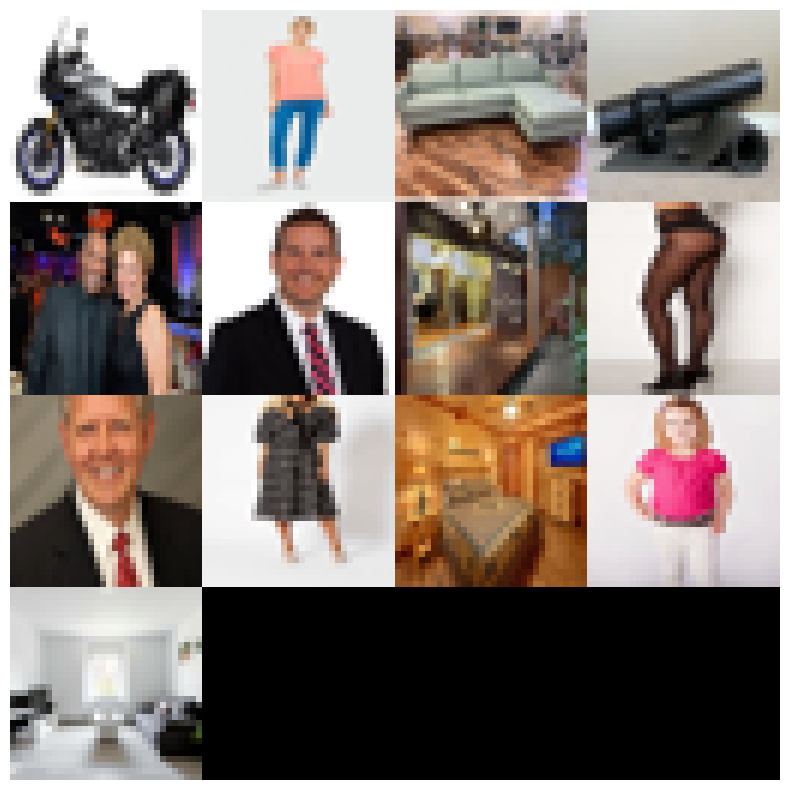

In [ ]:
def images_to_sprite(data,invert_colors=False):

    #if data.shape[1:3] != target_size:
        #data = np.array(resize_images([Image.fromarray(img) for img in data], target_size))

    if len(data.shape) == 3:
        data = np.tile(data[...,np.newaxis], (1,1,1,3))
    data = data.astype(np.float32)
    min = np.min(data.reshape((data.shape[0], -1)), axis=1)
    data = (data.transpose(1,2,3,0) - min).transpose(3,0,1,2)
    max = np.max(data.reshape((data.shape[0], -1)), axis=1)
    data = (data.transpose(1,2,3,0) / max).transpose(3,0,1,2)
    # Inverting the colors seems to look better for MNIST
    if invert_colors:
       data = 1 - data

    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = ((0, n ** 2 - data.shape[0]), (0, 0),
            (0, 0)) + ((0, 0),) * (data.ndim - 3)
    data = np.pad(data, padding, mode='constant',
            constant_values=0)
    # Tile the individual thumbnails into an image.
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3)
            + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    data = (data * 255).astype(np.uint8)
    return data, n

# Subsample the dataset
num_selected = 6*6
images_2d = np.array(images[:num_selected,:,:,:]).reshape(-1, 32, 32, 3)

# Create the sprite image
sprite, n = images_to_sprite(images_2d)
sprite_path = os.path.join(result_dir, f'{result_name}_sprite.png')
Image.fromarray(sprite).save(sprite_path)
print(f'Sprite image saved at: {sprite_path}')
#Image.fromarray(sprite).show()
fig = plt.figure(figsize=(10,10))
plt.imshow(sprite)
plt.axis('off')

# Tensorboard visualisation of CLIP Image Embeddings

In [ ]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/
!rm -rf ./logs_4/
!rm -rf ./logs1/
!rm -rf ./logs2/

In [ ]:
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorboard.plugins import projector

log_dir='logs3/embedding/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

embedding_tensor=tf.convert_to_tensor(image_embeddings)
urls=dataframe['url']
text=[]
for i in range(len(dataframe)):
   text_extracted=dataframe['text'].iloc[i][0]
   text.append(text_extracted)

scaler = MinMaxScaler()
normalized_emb =  tf.convert_to_tensor(scaler.fit_transform(embedding_tensor))


kmeans = KMeans(n_clusters=2, random_state=0).fit(normalized_emb)

with open(os.path.join(log_dir, 'img_metadata.tsv'), "w") as f:
  f.write("Corresponding LLM_Text\tCluster\n")
  for _,text,label in zip(urls,text,kmeans.labels_):
    f.write("{}\t{}\n".format(text, label))

weights = tf.Variable(embedding_tensor)
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
# Add path to the sprite image
#embedding.sprite.image_path = os.path.basename(sprite_path)
#embedding.sprite.single_image_dim.extend([32, 32])

embedding.metadata_path = 'img_metadata.tsv'
projector.visualize_embeddings(log_dir, config)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


# CLIP PCA Image Embeddings: An Unexpected Contextual Challenge

In most scenarios, CLIP PCA image embeddings provide a fairly accurate contextual match.

> However, anomalies can arise. Consider this: an image paired with the text “A black man and woman stand side by side during a celebration” has its 4th nearest neighbor—based on Euclidean distance—as an image of a motorcycle.

# Surprising, Right?


## Curious Cases of Contextual Mismatches

> In another instance, a fitness mat and a kettlebell—typically associated with home exercise—appear as the 4th or 5th nearest neighbors to a sofa and images of home décor. Meanwhile, a model and a motorcycle image are positioned closer to each other based on both cosine and Euclidean distances.


# Anomalies or Insights?
These examples highlight the nuanced complexities in embedding space, where context can sometimes defy expectations.

In [ ]:
%tensorboard --logdir /content/logs3/embedding

Reusing TensorBoard on port 6009 (pid 10668), started 0:03:36 ago. (Use '!kill 10668' to kill it.)

<IPython.core.display.Javascript object>

### To run the tensoboard use "%tensorboard --logdir /path/to/logs/embedding" where log folder should be embedding logs generated using tensorflow variables